# 모듈

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random

# 한글 깨짐 방지
import koreanize_matplotlib

#Time Series Analysis
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, kpss, ccf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# clustering
from sklearn.cluster import KMeans

# 스케일링
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# 모델링
from sklearn.model_selection import cross_validate
from keras.models import Sequential
from tensorflow import keras
from keras.layers import LSTM
from keras.layers import Dense, Dropout
from sklearn.metrics import mean_absolute_error
from statsmodels.tsa.arima.model import ARIMA

# 시스템
from tqdm.notebook import tqdm
import os
import warnings
warnings.filterwarnings('ignore')

2023-11-02 00:40:42.528528: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-11-02 00:40:44.820313: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-02 00:40:44.820355: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-02 00:40:44.836222: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-02 00:40:46.289204: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-11-02 00:40:46.298962: I tensorflow/core/platform/cpu_feature_guard.cc:182] This Tens

In [2]:
# 시드 고정
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seed_everything(42)

# 데이터 불러오기

In [3]:
train = pd.read_csv('train.csv', encoding='cp949')
test = pd.read_csv('test.csv', encoding='cp949')
sub = pd.read_csv('sample_submission.csv', encoding='cp949')

# feature 이름 변경

In [4]:
train.columns = ['건물번호', '시간', '전력사용량', '기온','풍속', '습도', '강수량', '일조', '비전기냉방설비운영', '태양광보유']
test.columns = ['건물번호', '시간', '기온', '풍속', '습도', '강수량', '일조', '비전기냉방설비운영', '태양광보유']

# 결측치 처리

## 비전기냉방설비, 태양광보유 결측치 처리

In [5]:
building_info = train[['건물번호','비전기냉방설비운영', '태양광보유']].drop_duplicates()

test.drop(['비전기냉방설비운영', '태양광보유'], axis=1, inplace = True)
test = pd.merge(test, building_info, on= '건물번호')

## 기온, 풍속, 습도, 강수량 결측치 처리

In [6]:
# train 임의의 결측치 만들기
train_ = train.copy()
def make_train_nan(col, n):
    new_list = []
    for idx, temp in enumerate(train_[col]):
        if idx%n==0:
            new_list.append(temp)
        else:
            new_list.append(np.nan)
    train_['{}'.format(col+'_nan')] = new_list


make_train_nan('기온',3)
make_train_nan('풍속',3)
make_train_nan('습도',3)
make_train_nan('강수량',6)

print(train_.iloc[:,-4:].isnull().sum())

기온_nan      81600
풍속_nan      81600
습도_nan      81600
강수량_nan    102000
dtype: int64


In [7]:
def compare_interpolate_methods(col, methods, metric):
    error_dict = dict()
    for method in methods:
        fillna = train_['{}'.format(col+'_nan')].interpolate(method=method)
        if fillna.isna().sum() != 0:
            fillna = fillna.interpolate(method='linear')
        error = metric(train_['{}'.format(col)], fillna)
        error_dict['{}'.format(method)] = error
    
    return error_dict

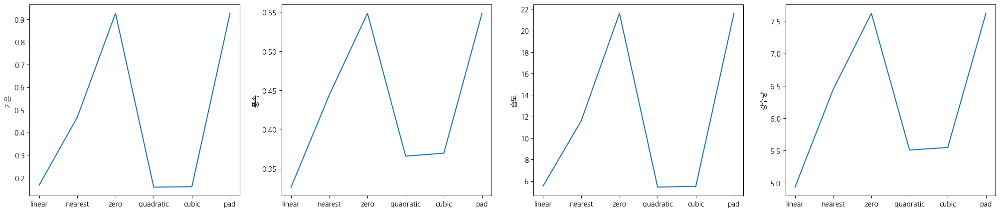

In [8]:
from sklearn.metrics import mean_squared_error
all_cols_error_dict = dict()
for col in ['기온', '풍속', '습도', '강수량']:
    methods = ['linear', 'nearest', 'zero', 'quadratic', 'cubic', 'pad']
    error_dict = compare_interpolate_methods(col, methods, mean_squared_error)
    all_cols_error_dict['{}'.format(col)] = error_dict
    
all_cols_error_df = pd.DataFrame(all_cols_error_dict)

fig, axes = plt.subplots(1,4, figsize = (25,5), sharey=False)
for i in range(len(all_cols_error_df.columns)):
    sns.lineplot(ax=axes[i], data=all_cols_error_df.iloc[:,i].transpose())

In [9]:
#기온 결측치 채우기
test['기온'] = test['기온'].interpolate(method='quadratic')
#마지막 na 채우기
test['기온'] = test['기온'].interpolate(method='linear')

#풍속 결측치 채우기
test['풍속'] = test['풍속'].interpolate(method='linear')

#습도 결측치 채우기
test['습도'] = test['습도'].interpolate(method='quadratic')
#마지막 na 채우기
test['습도'] = test['습도'].interpolate(method='linear')

#강수량 결측치 채우기
test['강수량'] = test['강수량'].interpolate(method='linear')

test['일조'] = test['일조'].interpolate(method='pad')

In [10]:
# 일조 최대값 3이기 때문에 minmax 진행
def scale_column(column):
    min_val = column.min()
    max_val = column.max()
    scaled_column = (column - min_val) / (max_val - min_val)
    return scaled_column

test['일조'] = scale_column(test['일조'])

# 이상치 처리

## 9, 25, 27번 이상치 처리

In [11]:
# 9번
train[(train['건물번호']==9) & (train['전력사용량']<1000)];
train.loc[16374,'전력사용량'] = (1200 + 1251.180) / 2
train.loc[16375,'전력사용량'] = (1200 + 1255.176) / 2
train.loc[16376,'전력사용량'] = (1200 + 1249.668) / 2
train.loc[16377,'전력사용량'] = (1200 + 1234.332) / 2
train.loc[16378,'전력사용량'] = (1200 + 1199.556) / 2
train.loc[16379,'전력사용량'] = (1200 + 1204.524) / 2
train.loc[16380,'전력사용량'] = (1200 + 1196.748) / 2
train.loc[16381,'전력사용량'] = (1200 + 1186.704) / 2
train.loc[16382,'전력사용량'] = (1200 + 1187.028) / 2
train.loc[16383,'전력사용량'] = (1200 + 1197.396) / 2
train.loc[16402,'전력사용량'] = (1200 + 1256.472) / 2
train.loc[17407,'전력사용량'] = (1302.156 + 1285.848) / 2
train.loc[17408,'전력사용량'] = (1289.844 + 1287.144) / 2
train.loc[17409,'전력사용량'] = (1264.356 + 1294.056) / 2
train.loc[17410,'전력사용량'] = (1250.316 + 1304.424) / 2
train.loc[17411,'전력사용량'] = (1255.392 + 1293.732) / 2
train.loc[17412,'전력사용량'] = (1248.804 + 1291.032) / 2
train.loc[17413,'전력사용량'] = (1253.664 + 1299.564) / 2
train.loc[17414,'전력사용량'] = (1257.552 + 1302.588) / 2
train.loc[17415,'전력사용량'] = (1270.944 + 1305.504) / 2
train.loc[17416,'전력사용량'] = (1326.024 + 1310.580) / 2
train.loc[17530,'전력사용량'] = (1285.416 + 1314.468) / 2
train.loc[17531,'전력사용량'] = (1279.692000 + 1317.708000) / 2
train.loc[17532,'전력사용량'] = (1276.884000 + 1278.828000) / 2
train.loc[17533,'전력사용량'] = (1287.252000 + 1280.124000) / 2

# 25번
train[(train['건물번호']==25) & (train['전력사용량']<500)];
train.loc[49954,'전력사용량'] = (1270.080 + 1041.984) / 2
train.loc[49955,'전력사용량'] = (1257.768 + 1039.392) / 2

# 27번
train[(train['건물번호']==27) & (train['전력사용량']<100)];
train.loc[54684,'전력사용량'] = (241.38 + 439.02) / 2
train.loc[54685,'전력사용량'] = (541.35 + 460.35) / 2
train.loc[54686,'전력사용량'] = (564.03 + 582.93) / 2
train.loc[54687,'전력사용량'] = (588.06 + 561.06) / 2
train.loc[54688,'전력사용량'] = (615.06 + 540.27) / 2
train.loc[55044,'전력사용량'] = (368.01 + 235.44) / 2

## 31, 33, 36번 이상치 처리

In [12]:
def power_mean(index1, index2, target) :
    val1 = train.loc[index1, '전력사용량']
    val2 = train.loc[index2, '전력사용량']
    power_avg = round(np.mean([val1, val2]), 3)
    train.loc[target, '전력사용량'] = power_avg

# 31번 건물
power_mean(61289, 61625, 61457)

# 33번 건물
power_mean(65369, 65705, 65537)

# 36번 건물
# 6월 19일 6시
power_mean(71670, 72006, 71838)

# 8월 12일 5~8시
power_mean(72965, 73301, 73133)
power_mean(72966, 73302, 73134)
power_mean(72967, 73303, 73135)
power_mean(72967, 73304, 73136)

## 45, 55, 60번 건물 이상치 처리

In [13]:
# 45번 건물
train.loc[90577,'전력사용량'] = (train.loc[90409,'전력사용량'] + train.loc[90745,'전력사용량']) / 2

# 55번 건물
train.loc[111802,'전력사용량'] = (train.loc[111634,'전력사용량'] + train.loc[111970,'전력사용량']) / 2
train.loc[111803,'전력사용량'] = (train.loc[111635,'전력사용량'] + train.loc[111971,'전력사용량']) / 2
train.loc[111808,'전력사용량'] = (train.loc[111640,'전력사용량'] + train.loc[111976,'전력사용량']) / 2
train.loc[111809,'전력사용량'] = (train.loc[111641,'전력사용량'] + train.loc[111977,'전력사용량']) / 2

# 60번 건물
train.loc[121081,'전력사용량'] = (train.loc[120913,'전력사용량'] + train.loc[121249,'전력사용량']) / 2

## 이상치 변경 확인

In [14]:
# # 고유한 건물번호 추출
# building_numbers = train['건물번호'].unique()

# # 건물번호별로 그래프 그리기
# fig, axes = plt.subplots(len(building_numbers), 1, figsize=(15, 6*len(building_numbers)), sharex=True)

# for i, building_number in enumerate(building_numbers):
#     building_data = train[train['건물번호'] == building_number]
#     axes[i].plot(building_data['시간'], building_data['전력사용량'])
#     axes[i].set_xlabel('시간')
#     axes[i].set_ylabel('전력사용량')
#     axes[i].set_title(f'건물번호 {building_number} 전력사용량')

# feature engineering

## 시간

In [15]:
train['시간'] = pd.to_datetime(train['시간'])
test['시간'] = pd.to_datetime(test['시간'])

# ARIMA

In [16]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122400 entries, 0 to 122399
Data columns (total 10 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   건물번호       122400 non-null  int64         
 1   시간         122400 non-null  datetime64[ns]
 2   전력사용량      122400 non-null  float64       
 3   기온         122400 non-null  float64       
 4   풍속         122400 non-null  float64       
 5   습도         122400 non-null  float64       
 6   강수량        122400 non-null  float64       
 7   일조         122400 non-null  float64       
 8   비전기냉방설비운영  122400 non-null  float64       
 9   태양광보유      122400 non-null  float64       
dtypes: datetime64[ns](1), float64(8), int64(1)
memory usage: 9.3 MB


In [17]:
#2d의 데이터프레임을 건물별 정보를 반영한 3d 데이터로 변환
def df2d_to_array3d(df_2d):
    feature_size=df_2d.iloc[:,2:].shape[1]
    time_size=len(df_2d['시간'].value_counts())
    sample_size=len(df_2d.건물번호.value_counts())
    return df_2d.iloc[:,2:].values.reshape([sample_size, time_size, feature_size])

In [18]:
train_x_array=df2d_to_array3d(train)
test_x_array=df2d_to_array3d(test)

In [19]:
print(train_x_array.shape)
print(test_x_array.shape)

(60, 2040, 8)
(60, 168, 7)


In [22]:
train_x_array[0, : , 0]

array([8179.056, 8135.64 , 8107.128, ..., 8730.504, 8725.968, 8705.232])

In [29]:
order = { 1 : (3, 0, 0), 2 : (2, 0, 8), 3 : (2, 0, 0), 4 : (2, 0, 7),
          5 : (2, 0, 0), 6 : (2, 0, 8), 7 : (2, 0, 9), 8 : (2, 0, 8),
          9 : (2, 0, 0), 10 : (2, 0, 7), 11 : (2, 0, 7), 12 : (2, 0, 7),
          13 : (2, 0, 8), 14 : (2, 0, 8), 15 : (2, 0, 0), 16 : (2, 0, 8),
          17 : (2, 0, 8), 18 : (2, 0, 0), 19 : (2, 0, 0), 20 : (2, 0, 6),
          21 : (2, 0, 7), 22 : (2, 0, 9), 23 : (2, 0, 0), 24 : (2, 0, 0),
          25 : (2, 0, 8), 26 : (2, 0, 8), 27 : (2, 0, 0), 28 : (2, 0, 8),
          29 : (2, 0, 7), 30 : (2, 0, 0), 31 : (2, 0, 0), 32 : (2, 0, 8),
          33 : (2, 0, 8), 34 : (2, 0, 7), 35 : (2, 0, 7), 36 : (2, 0, 7),
          37 : (2, 0, 9), 38 : (2, 0, 7), 39 : (2, 0, 8), 40 : (2, 0, 6),
          41 : (2, 0, 7), 42 : (2, 0, 7), 43 : (2, 0, 7), 44 : (2, 0, 8),
          45 : (2, 0, 7), 46 : (2, 0, 7), 47 : (2, 0, 7), 48 : (2, 0, 8),
          49 : (2, 0, 7), 50 : (2, 0, 0), 51 : (2, 0, 6), 52 : (2, 0, 8),
          53 : (2, 0, 8), 54 : (2, 0, 9), 55 : (2, 0, 7), 56 : (2, 0, 8),
          57 : (2, 0, 0), 58 : (2, 0, 7), 59 : (2, 0, 0), 60 : (2, 0, 8)}

In [37]:
valid_pred_array=np.zeros([60, 168])
for i in range(60):
  x_series=train_x_array[i, :, 0]
  model=ARIMA(x_series, order=(5, 1, 1))
  fit=model.fit()
  preds=fit.predict(2040 - 167, 2040, typ='levels')
  valid_pred_array[i, :]=preds

In [38]:
valid_pred_array.shape

(60, 168)

In [39]:
test['전력사용량'] = valid_pred_array.reshape(-1, 1)

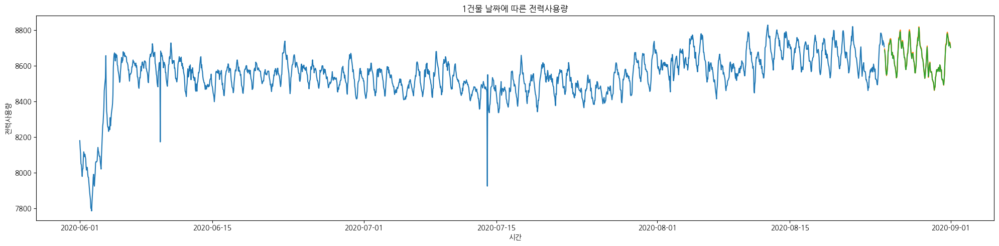

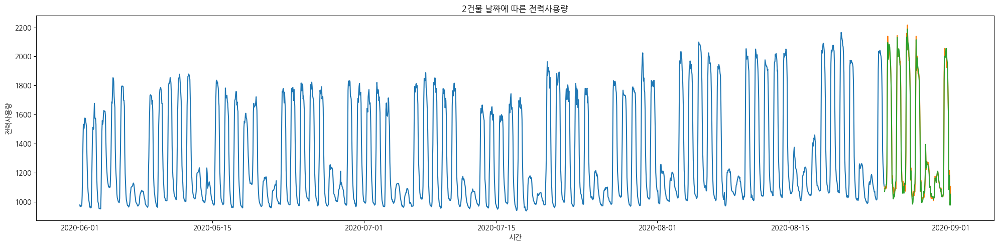

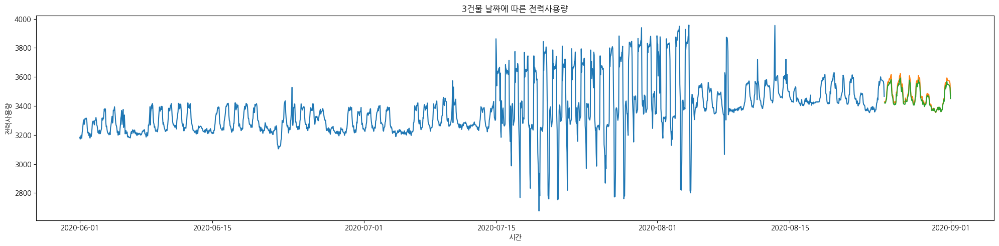

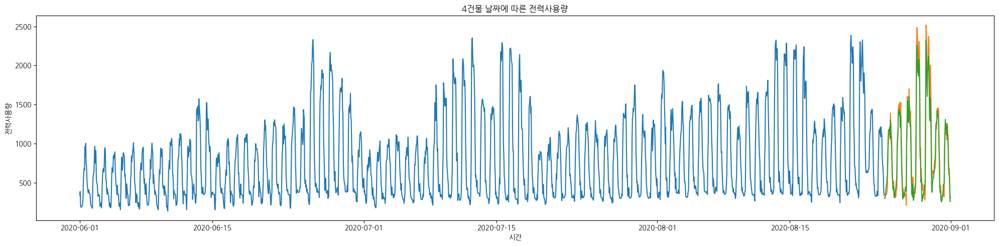

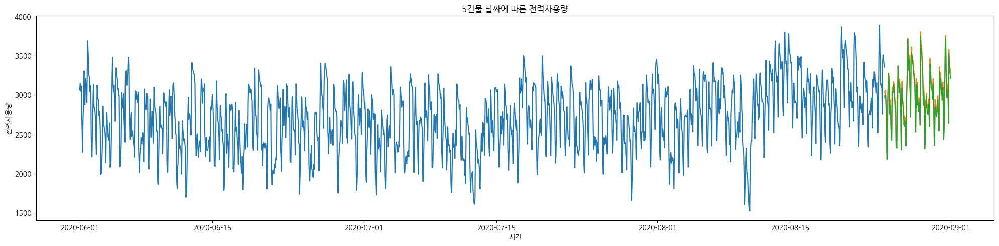

...

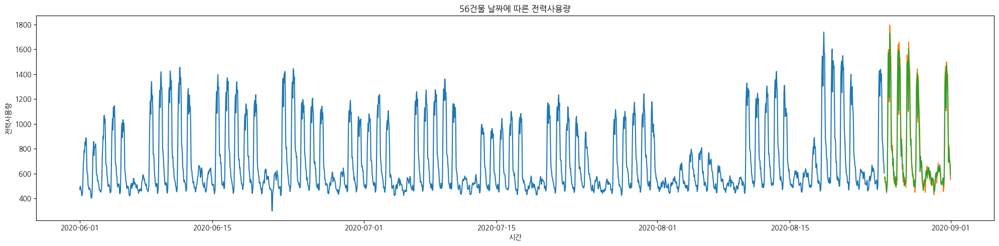

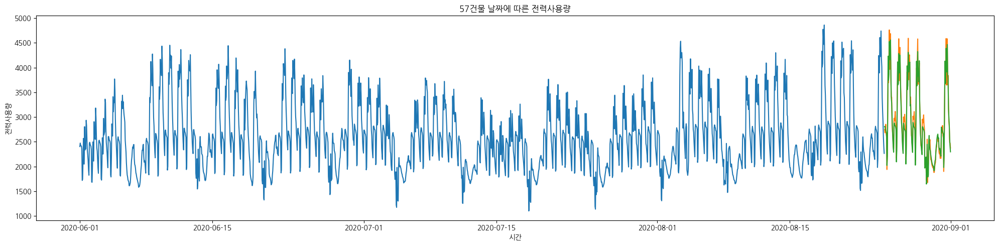

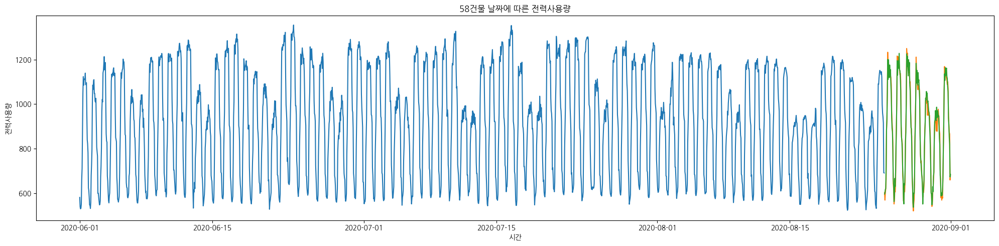

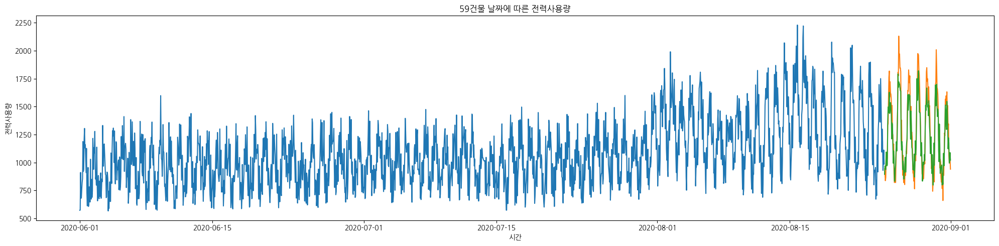

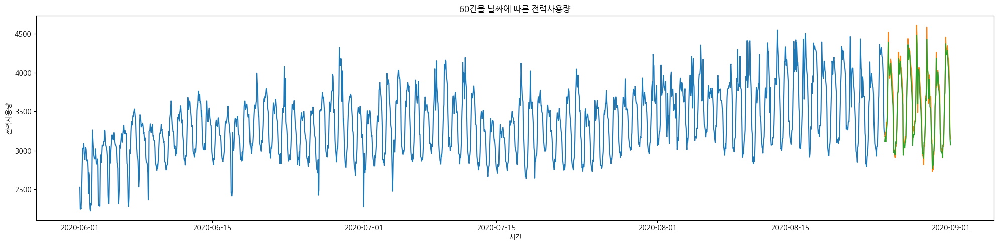

In [40]:
for i in range(1, 61):
    fig = plt.figure(figsize = (20, 5))
    ax = fig.add_subplot()
    ax = sns.lineplot(x=train[(train['건물번호'] == i)]['시간'],
                        y=train[(train['건물번호'] == i)]['전력사용량'])
    ax = sns.lineplot(x=test[(test['건물번호'] == i)]['시간'],
                        y=test[(test['건물번호'] == i)]['전력사용량'])
    ax = sns.lineplot(x=test[(test['건물번호'] == i)]['시간'],
                        y=test[(test['건물번호'] == i)]['전력사용량_0'])
    # ax.set_ylim(2000, 8000)
    # ax.set_xlim(0, 24)
    # ax.set_title(f'6월 {i}일 전력사용량')
    
    # plt.grid(False)
    plt.title(f'{i}건물 날짜에 따른 전력사용량')
    # plt.xlabel('날짜')
    # plt.ylabel('전력사용량(kWh)', rotation = True, labelpad = 20)
    fig.tight_layout()
    plt.show()

In [41]:
sub['answer'] = test['전력사용량']
sub

,num_date_time,answer
0,1 2020-08-25 00,8693.652638
1,1 2020-08-25 01,8675.290975
2,1 2020-08-25 02,8646.528766
3,1 2020-08-25 03,8585.735976
4,1 2020-08-25 04,8556.629172
...,...,...
10075,60 2020-08-31 19,4093.461519
10076,60 2020-08-31 20,3940.567346
10077,60 2020-08-31 21,3470.719757
10078,60 2020-08-31 22,3223.064006


In [42]:
sub.to_csv('sub.csv', index = False)